# Style Transfer with a Wasserstein Metric 

This is a pytorch implementation of [Style Transfer as Optimum Transport](https://github.com/VinceMarron/style_transfer) by Vince Marron. 

This technique uses an L2-Wasserstein distance to optimize style transfer from one image to another. Similar to the [Gatys et. al](https://arxiv.org/abs/1508.06576) approach, the content image and the style image are passed through a pretrained convolutional model (in this cae VGG16) and the activations of both images at various layers are used as input to the loss function.

Unlike the Gatys approach, this technique does not use a combination of content loss and style loss. There is only one loss function - the L2-Wasserstein metric.

To simplify calculation of the metric, this technique assumes that the activations input into the loss function are multivariate Gaussian distributions modeled by the first two moments. This allows for a very straightforward calculation of the loss.

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import torch, torch.nn.functional as F
from torch import ByteTensor, DoubleTensor, FloatTensor, HalfTensor, LongTensor, ShortTensor, Tensor
from torch import nn, optim, as_tensor
from torch.utils.data import BatchSampler, DataLoader, Dataset, Sampler, TensorDataset
import torchvision
import math, matplotlib.pyplot as plt, numpy as np, pandas as pd, random
import PIL
from torchvision.models import vgg16_bn

In [3]:
from functools import partial

In [4]:
torch.backends.cudnn.benchmark=True

In [5]:
class SaveFeatures():
    features=None
    def __init__(self, m): self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output): self.features = output
    def close(self): self.hook.remove()

In [6]:
m_vgg = list(vgg16_bn(True).children())[0].eval().cuda()

This is the content image

In [7]:
cnt_fn = 'styles/wave_small.jpg'

In [8]:
cnt_img_ob = PIL.Image.open(cnt_fn)

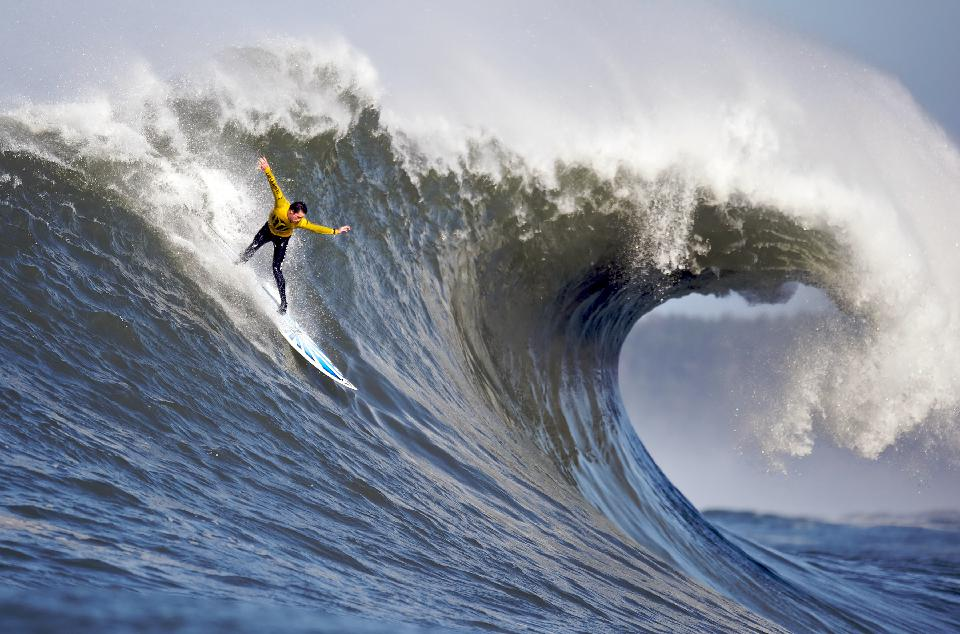

In [10]:
cnt_img_ob

This is the style image

In [11]:
style_fn = 'styles/The_Great_Wave_off_Kanagawa.jpg'

In [12]:
style_img_ob = PIL.Image.open(style_fn)

In [13]:
style_img_ob = style_img_ob.resize((960, 634))

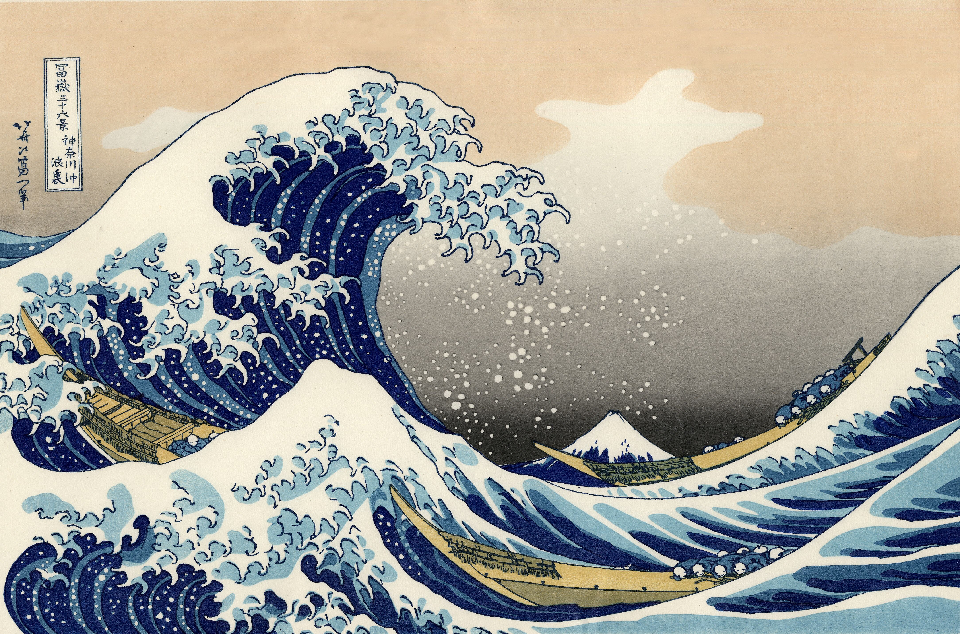

In [14]:
style_img_ob

In [15]:
def pil2tensor(image):
    arr = ByteTensor(torch.ByteStorage.from_buffer(image.tobytes()))
    arr = arr.view(image.size[1], image.size[0], -1)
    return arr.permute(2,0,1).float().div_(255)

In [16]:
cnt_tensor = pil2tensor(cnt_img_ob)

In [18]:
style_tensor = pil2tensor(style_img_ob)

In [20]:
cnt_tensor = cnt_tensor[None].cuda()

In [21]:
style_tensor = style_tensor[None].cuda()

This is the calculation of the L2-Wasserstein loss, based on this equation:

![text](styles/wass_loss.png)

In [22]:
def calc_2_moments(tensor):
    chans = tensor.shape[1]
    tensor = tensor.view(1, chans, -1)
    n = tensor.shape[2]
    
    mu = tensor.mean(2)
    tensor = (tensor - mu[:,:,None]).squeeze(0)
    cov = torch.mm(tensor, tensor.t()) / float(n)
    
    return mu, cov

In [23]:
def get_style_vals(tensor):
    mean, cov = calc_2_moments(tensor)
    
    eigvals, eigvects = torch.symeig(cov, eigenvectors=True)
    
    eigroot_mat = torch.diag(torch.sqrt(eigvals.clamp(min=0)))
    
    root_cov = torch.mm(torch.mm(eigvects, eigroot_mat), eigvects.t())
    
    tr_cov = eigvals.clamp(min=0).sum()
    
    return mean, tr_cov, root_cov

In [24]:
def calc_l2wass_dist(mean_stl, tr_cov_stl, root_cov_stl, mean_synth, cov_synth):
    
    tr_cov_synth = torch.symeig(cov_synth, eigenvectors=True)[0].clamp(min=0).sum()
    
    mean_diff_squared = (mean_stl - mean_synth).pow(2).sum()
    
    cov_prod = torch.mm(torch.mm(root_cov_stl, cov_synth), root_cov_stl)
    
    var_overlap = torch.sqrt(torch.symeig(cov_prod, eigenvectors=True)[0].clamp(min=0)+1e-8).sum()
    
    dist = mean_diff_squared + tr_cov_stl + tr_cov_synth - 2*var_overlap
    
    return dist

In [25]:
def single_wass_loss(pred, targ):
    mean_test, tr_cov_test, root_cov_test = targ
    mean_synth, cov_synth = calc_2_moments(pred)
    loss = calc_l2wass_dist(mean_test, tr_cov_test, root_cov_test, mean_synth, cov_synth)
    return loss

In [26]:
def wass_loss(input_tensor):
    m_vgg(input_tensor)
    outs = [o.features for o in sfs]

    losses = [single_wass_loss(p, t) for p, t in zip(outs, targ_stats)]
    return sum(losses)

### Activations: Conv, all layers
### Optim: LBFGS

In [27]:
#conv out
block_ends = [0, 3, 7, 10, 14, 17, 20, 24, 27, 30, 34, 37, 40]

In [28]:
sfs = [SaveFeatures(list(m_vgg.children())[idx]) for idx in block_ends]
m_vgg(style_tensor);

In [29]:
targ_styles = [o.features.clone().detach().requires_grad_(False) for o in sfs]

In [30]:
targ_stats = [get_style_vals(i) for i in targ_styles]

In [31]:
input_tensor = cnt_tensor.clone().detach().requires_grad_(True)
opt = optim.LBFGS([input_tensor])

In [32]:
def step(loss_fn):
    global n_iter
    opt.zero_grad()
    loss = loss_fn(input_tensor)
    loss.backward()
    n_iter+=1
    if n_iter%50==0:
        print(f'Iteration: {n_iter}, loss: {loss.data}')
    return loss

In [33]:
n_iter=0
while n_iter <= 500: opt.step(partial(step,wass_loss))

Iteration: 50, loss: 3.3187031745910645
Iteration: 100, loss: 1.985438346862793
Iteration: 150, loss: 1.573270320892334
Iteration: 200, loss: 1.3409509658813477
Iteration: 250, loss: 1.1765789985656738
Iteration: 300, loss: 1.0461812019348145
Iteration: 350, loss: 0.9503188133239746
Iteration: 400, loss: 0.8789997100830078
Iteration: 450, loss: 0.8286914825439453
Iteration: 500, loss: 0.7915515899658203


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


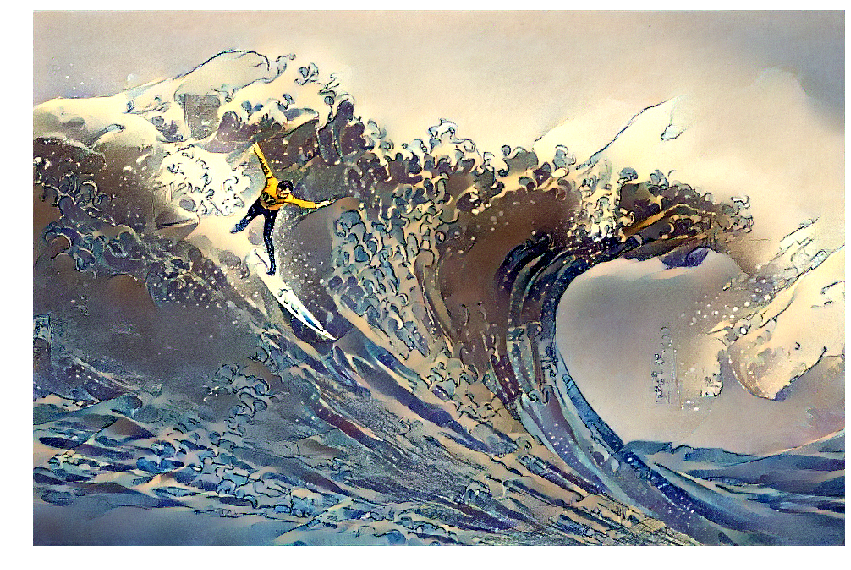

In [43]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
fig.tight_layout()
im = plt.imshow(np.rollaxis(input_tensor.detach().cpu()[0].clamp(min=0).numpy(), 0, 3))
plt.axis('off');

In [45]:
fig.savefig('styles/conv_all_lbfgs.jpg', bbox_inches='tight', dpi=100, pad_inches=-1)

### Activations: Conv, all layers
### Optim: Adam

In [46]:
block_ends = [0, 3, 7, 10, 14, 17, 20, 24, 27, 30, 34, 37, 40]

In [49]:
sfs = [SaveFeatures(list(m_vgg.children())[idx]) for idx in block_ends]
m_vgg(style_tensor);

In [50]:
targ_styles = [o.features.clone().detach().requires_grad_(False) for o in sfs]

In [51]:
targ_stats = [get_style_vals(i) for i in targ_styles]

In [52]:
input_tensor = cnt_tensor.clone().detach().requires_grad_(True)
opt = optim.Adam([input_tensor], lr=1e-2)

In [53]:
for i in range(500):
    opt.zero_grad()
    loss = wass_loss(input_tensor)
    loss.backward()
    opt.step()
    if (i+1)%50 == 0:
        print(loss)

tensor(3.6717, device='cuda:0', grad_fn=<AddBackward0>)
tensor(2.2399, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.7889, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.4810, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.4298, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.1791, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.1406, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.0924, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.0464, device='cuda:0', grad_fn=<AddBackward0>)
tensor(0.9439, device='cuda:0', grad_fn=<AddBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


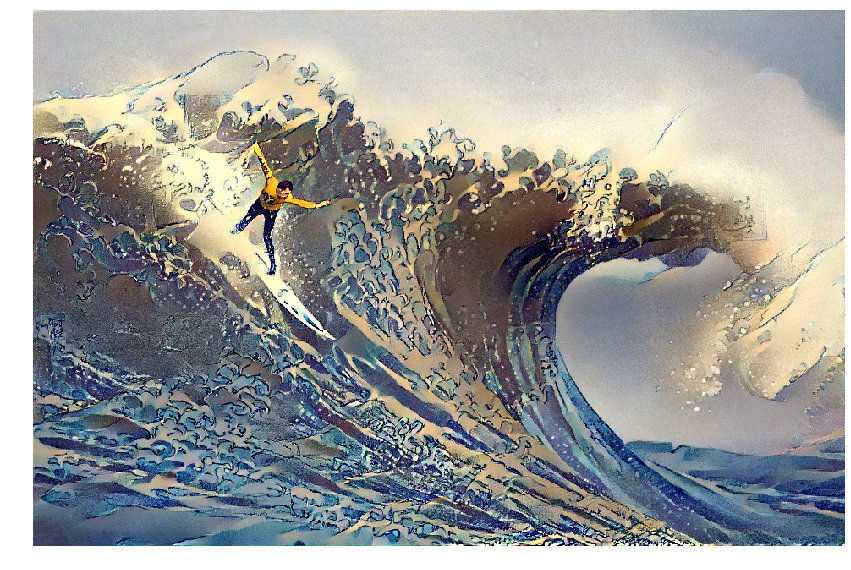

In [54]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
fig.tight_layout()
im = plt.imshow(np.rollaxis(input_tensor.detach().cpu()[0].clamp(min=0).numpy(), 0, 3))
plt.axis('off');

In [55]:
fig.savefig('styles/conv_all_adam.jpg', bbox_inches='tight', dpi=100, pad_inches=-1)

### Activations: Conv
### Optim: RMSProp

In [56]:
block_ends = [0, 3, 7, 10, 14, 17, 20, 24, 27, 30, 34, 37, 40]

In [57]:
sfs = [SaveFeatures(list(m_vgg.children())[idx]) for idx in block_ends]
m_vgg(style_tensor);

In [58]:
targ_styles = [o.features.clone().detach().requires_grad_(False) for o in sfs]

In [59]:
targ_stats = [get_style_vals(i) for i in targ_styles]

In [60]:
input_tensor = cnt_tensor.clone().detach().requires_grad_(True)
opt = optim.RMSprop([input_tensor], lr=1e-2)

In [61]:
for i in range(500):
    opt.zero_grad()
    loss = wass_loss(input_tensor)
    loss.backward()
    opt.step()
    if (i+1)%50 == 0:
        print(loss)

tensor(10.7006, device='cuda:0', grad_fn=<AddBackward0>)
tensor(9.3477, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.5602, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.5593, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.1873, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.1193, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5.9959, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5.1847, device='cuda:0', grad_fn=<AddBackward0>)
tensor(3.7672, device='cuda:0', grad_fn=<AddBackward0>)
tensor(4.2129, device='cuda:0', grad_fn=<AddBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


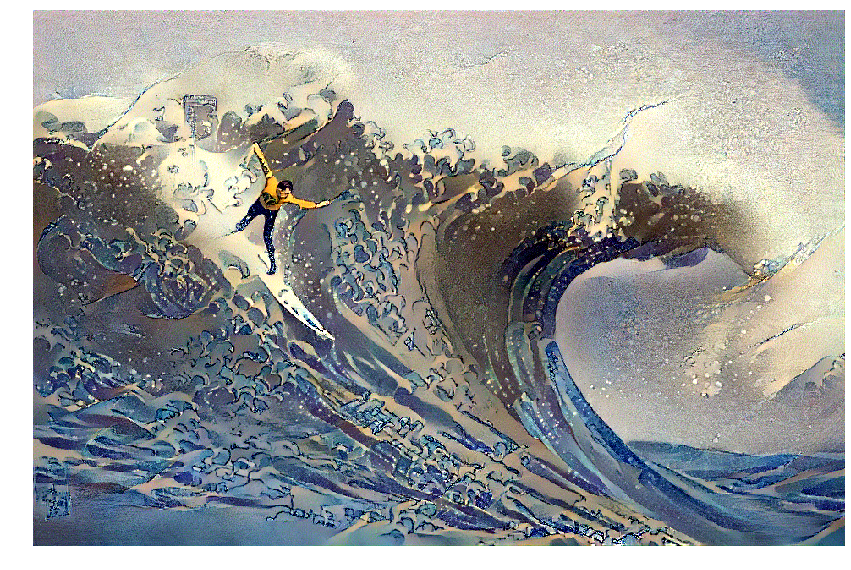

In [62]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
fig.tight_layout()
im = plt.imshow(np.rollaxis(input_tensor.detach().cpu()[0].clamp(min=0).numpy(), 0, 3))
plt.axis('off');

In [63]:
fig.savefig('styles/conv_all_rms.jpg', bbox_inches='tight', dpi=100, pad_inches=-1)

### Activations: Batchnorm
### Optim: LBFGS

In [64]:
block_ends = [0, 3, 7, 10, 14, 17, 20, 24, 27, 30, 34, 37, 40]
block_ends = [i+1 for i in block_ends]

In [65]:
sfs = [SaveFeatures(list(m_vgg.children())[idx]) for idx in block_ends]
m_vgg(style_tensor);

In [66]:
targ_styles = [o.features.clone().detach().requires_grad_(False) for o in sfs]

In [67]:
targ_stats = [get_style_vals(i) for i in targ_styles]

In [68]:
input_tensor = cnt_tensor.clone().detach().requires_grad_(True)
opt = optim.LBFGS([input_tensor])

In [69]:
n_iter=0
while n_iter <= 500: opt.step(partial(step,wass_loss))

Iteration: 50, loss: 1.2888696193695068
Iteration: 100, loss: 0.7347826957702637
Iteration: 150, loss: 0.5591146945953369
Iteration: 200, loss: 0.4688624143600464
Iteration: 250, loss: 0.4095847010612488
Iteration: 300, loss: 0.3674733638763428
Iteration: 350, loss: 0.33479851484298706
Iteration: 400, loss: 0.3087150454521179
Iteration: 450, loss: 0.2881348133087158
Iteration: 500, loss: 0.27074146270751953


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


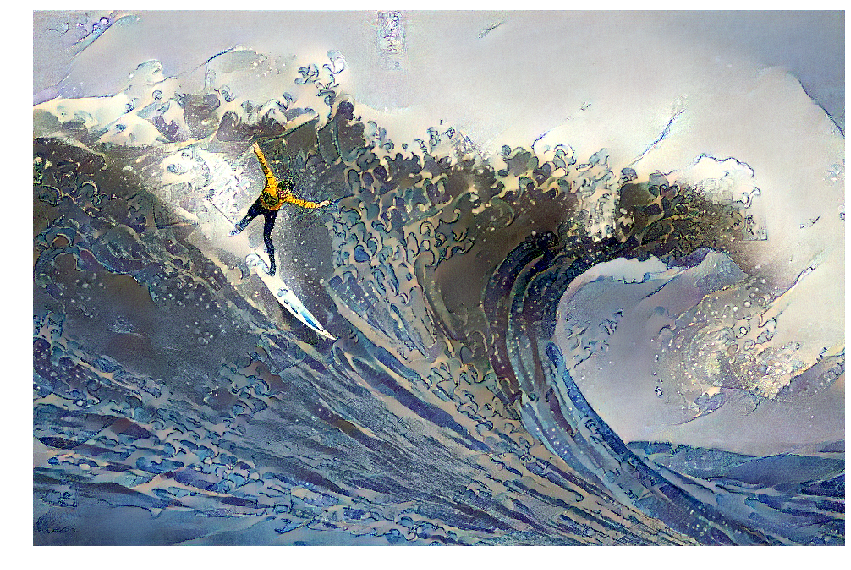

In [70]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
fig.tight_layout()
im = plt.imshow(np.rollaxis(input_tensor.detach().cpu()[0].clamp(min=0).numpy(), 0, 3))
plt.axis('off');

In [71]:
fig.savefig('styles/bn_all_lbfgs.jpg', bbox_inches='tight', dpi=100, pad_inches=-1)

### Activations: Relu
### Optim: LBFGS

In [72]:
block_ends = [0, 3, 7, 10, 14, 17, 20, 24, 27, 30, 34, 37, 40]
block_ends = [i+2 for i in block_ends]

In [73]:
sfs = [SaveFeatures(list(m_vgg.children())[idx]) for idx in block_ends]
m_vgg(style_tensor);

In [74]:
targ_styles = [o.features.clone().detach().requires_grad_(False) for o in sfs]

In [75]:
targ_stats = [get_style_vals(i) for i in targ_styles]

In [76]:
input_tensor = cnt_tensor.clone().detach().requires_grad_(True)
opt = optim.LBFGS([input_tensor])

In [77]:
n_iter=0
while n_iter <= 500: opt.step(partial(step,wass_loss))

Iteration: 50, loss: 1.295097827911377
Iteration: 100, loss: 0.7484527230262756
Iteration: 150, loss: 0.5653303265571594
Iteration: 200, loss: 0.47486698627471924
Iteration: 250, loss: 0.4160812497138977
Iteration: 300, loss: 0.37273669242858887
Iteration: 350, loss: 0.34028810262680054
Iteration: 400, loss: 0.3140214681625366
Iteration: 450, loss: 0.293698787689209
Iteration: 500, loss: 0.27668237686157227


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


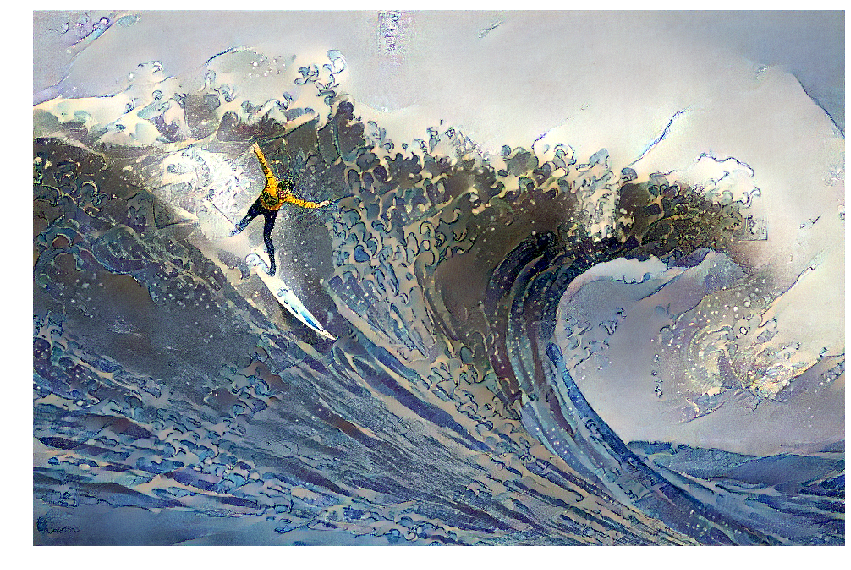

In [78]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
fig.tight_layout()
im = plt.imshow(np.rollaxis(input_tensor.detach().cpu()[0].clamp(min=0).numpy(), 0, 3))
plt.axis('off');

In [79]:
fig.savefig('styles/relu_all_lbfgs.jpg', bbox_inches='tight', dpi=100, pad_inches=-1)

### Activations: Early Conv
### Optim: LBFGS

In [80]:
block_ends = [0, 3, 7, 10, 14]

In [81]:
sfs = [SaveFeatures(list(m_vgg.children())[idx]) for idx in block_ends]
m_vgg(style_tensor);

In [82]:
targ_styles = [o.features.clone().detach().requires_grad_(False) for o in sfs]

In [83]:
targ_stats = [get_style_vals(i) for i in targ_styles]

In [84]:
input_tensor = cnt_tensor.clone().detach().requires_grad_(True)
opt = optim.LBFGS([input_tensor])

In [85]:
n_iter=0
while n_iter <= 500: opt.step(partial(step,wass_loss))

Iteration: 50, loss: 0.020001888275146484
Iteration: 100, loss: -0.01572418212890625
Iteration: 150, loss: -0.021842002868652344
Iteration: 200, loss: -0.01986217498779297
Iteration: 250, loss: -0.02039051055908203
Iteration: 300, loss: -0.023788928985595703
Iteration: 350, loss: -0.023356914520263672
Iteration: 400, loss: -0.023653507232666016
Iteration: 450, loss: -0.021877288818359375
Iteration: 500, loss: -0.024113178253173828


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


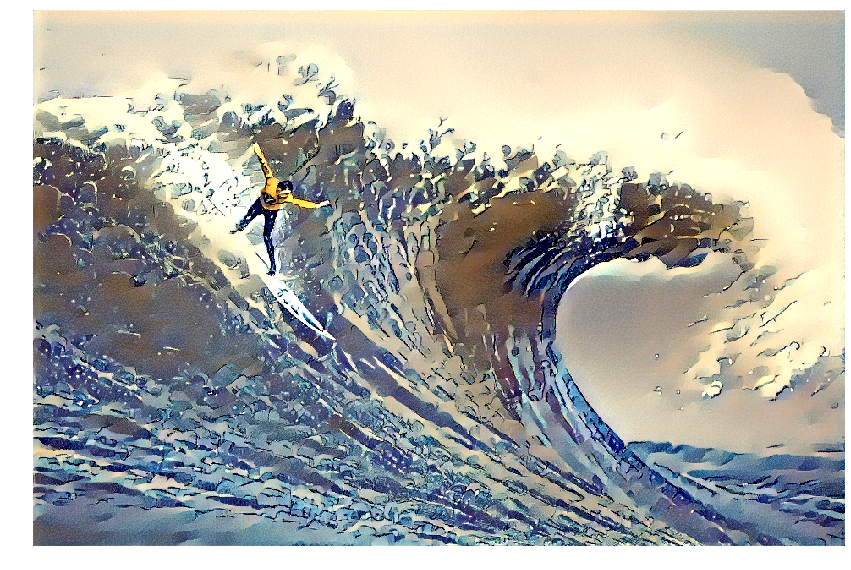

In [86]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
fig.tight_layout()
im = plt.imshow(np.rollaxis(input_tensor.detach().cpu()[0].clamp(min=0).numpy(), 0, 3))
plt.axis('off');

In [87]:
fig.savefig('styles/conv_early_lbfgs.jpg', bbox_inches='tight', dpi=100, pad_inches=-1)

### Activations: Middle Conv
### Optim: LBFGS

In [88]:
block_ends = [14, 17, 20, 24, 27]

In [89]:
sfs = [SaveFeatures(list(m_vgg.children())[idx]) for idx in block_ends]
m_vgg(style_tensor);

In [90]:
targ_styles = [o.features.clone().detach().requires_grad_(False) for o in sfs]

In [91]:
targ_stats = [get_style_vals(i) for i in targ_styles]

In [92]:
input_tensor = cnt_tensor.clone().detach().requires_grad_(True)
opt = optim.LBFGS([input_tensor])

In [93]:
n_iter=0
while n_iter <= 500: opt.step(partial(step,wass_loss))

Iteration: 50, loss: 0.5680665969848633
Iteration: 100, loss: 0.2689189910888672
Iteration: 150, loss: 0.18439579010009766
Iteration: 200, loss: 0.1377849578857422
Iteration: 250, loss: 0.11901473999023438
Iteration: 300, loss: 0.10945510864257812
Iteration: 350, loss: 0.09018230438232422
Iteration: 400, loss: 0.09004974365234375
Iteration: 450, loss: 0.08078193664550781
Iteration: 500, loss: 0.07544898986816406


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


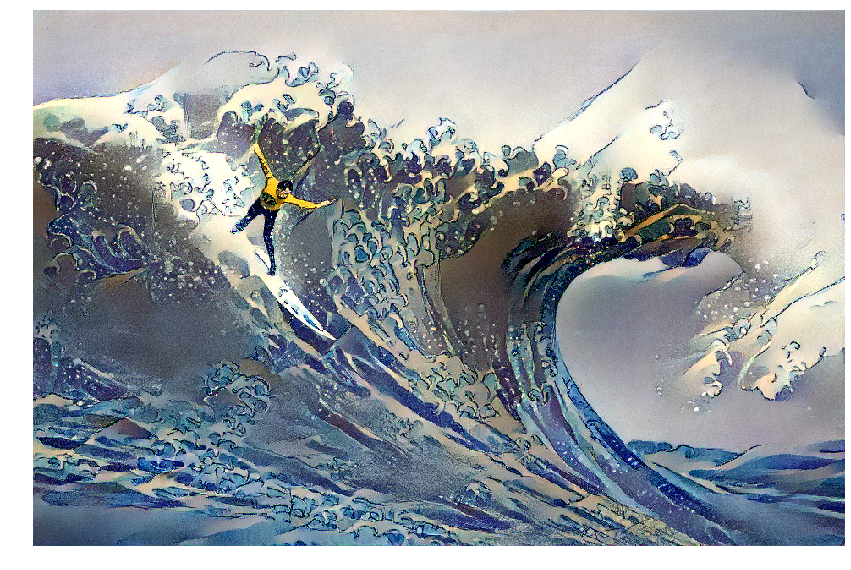

In [94]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
fig.tight_layout()
im = plt.imshow(np.rollaxis(input_tensor.detach().cpu()[0].clamp(min=0).numpy(), 0, 3))
plt.axis('off');

In [95]:
fig.savefig('styles/conv_middle_lbfgs.jpg', bbox_inches='tight', dpi=100, pad_inches=-1)

### Activations: Late Convs
### Optim: LBFGS

In [96]:
block_ends = [27, 30, 34, 37, 40]

In [97]:
sfs = [SaveFeatures(list(m_vgg.children())[idx]) for idx in block_ends]
m_vgg(style_tensor);

In [98]:
targ_styles = [o.features.clone().detach().requires_grad_(False) for o in sfs]

In [99]:
targ_stats = [get_style_vals(i) for i in targ_styles]

In [100]:
input_tensor = cnt_tensor.clone().detach().requires_grad_(True)
opt = optim.LBFGS([input_tensor])

In [101]:
n_iter=0
while n_iter <= 500: opt.step(partial(step,wass_loss))

Iteration: 50, loss: 1.3648967742919922
Iteration: 100, loss: 0.8411664962768555
Iteration: 150, loss: 0.6754188537597656
Iteration: 200, loss: 0.5923480987548828
Iteration: 250, loss: 0.5434112548828125
Iteration: 300, loss: 0.5137929916381836
Iteration: 350, loss: 0.4866790771484375
Iteration: 400, loss: 0.47182703018188477
Iteration: 450, loss: 0.455718994140625
Iteration: 500, loss: 0.44362592697143555


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


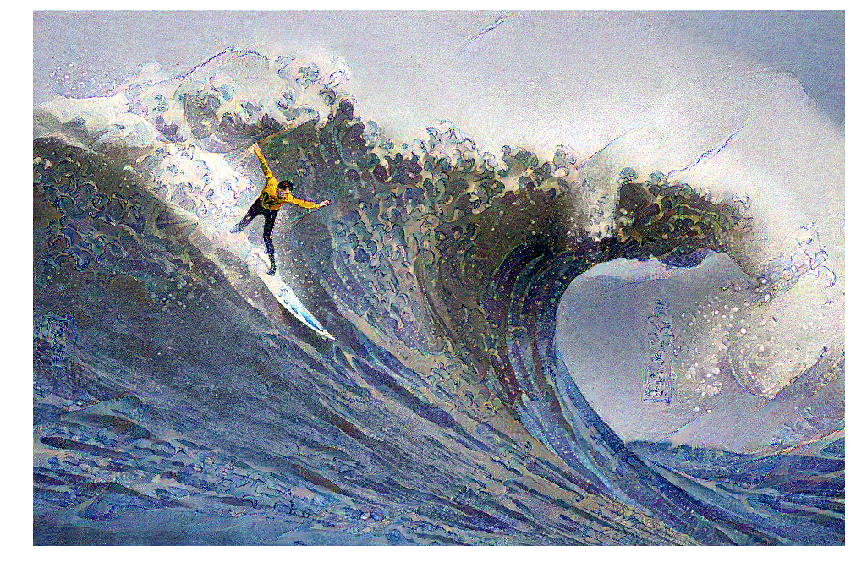

In [102]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
fig.tight_layout()
im = plt.imshow(np.rollaxis(input_tensor.detach().cpu()[0].clamp(min=0).numpy(), 0, 3))
plt.axis('off');

In [103]:
fig.savefig('styles/conv_late_lbfgs.jpg', bbox_inches='tight', dpi=100, pad_inches=-1)